# 🛰️ Street View × 景観スコア × 地価分析

このノートブックは、地価公示ポイントを軸に、その位置のStreet View画像から景観特徴量（緑視率、空率、物体検出）を抽出して分析します。

# 🚀 STEP 1: ライブラリのインストール

In [1]:
!pip install pandas numpy requests pillow matplotlib opencv-python scikit-learn ultralytics geopandas

# 🚀 STEP 2: Google APIキーの設定

In [2]:
import os
from dotenv import load_dotenv

# .envファイルから環境変数を読み込み
load_dotenv()

API_KEY = os.getenv("GOOGLE_MAPS_API_KEY")
if not API_KEY:
    raise ValueError("環境変数GOOGLE_MAPS_API_KEYが設定されていません。README.mdを参照してください。")

# 🚀 STEP 3 & 4: 地価公示データの読み込み

In [3]:
import pandas as pd
import geopandas as gpd
import os

target_folder = "L01-25_13_GML"

if os.path.exists(target_folder):
    files = os.listdir(target_folder)
    geojson_file = next((f for f in files if f.endswith('.geojson')), None)
    shp_file = next((f for f in files if f.endswith('.shp')), None)
    
    file_path = None
    if geojson_file:
        file_path = os.path.join(target_folder, geojson_file)
    elif shp_file:
        file_path = os.path.join(target_folder, shp_file)
        
    if file_path:
        print(f"Loading geospatial data from: {file_path}")
        gdf = gpd.read_file(file_path)
        
        gdf["lat"] = gdf.geometry.y
        gdf["lon"] = gdf.geometry.x
        
        possible_price_cols = ["L01_008", "L01_006", "price", "価格", "公示価格"]
        price_col = next((c for c in possible_price_cols if c in gdf.columns), None)
        
        possible_addr_cols = ["L01_025", "L01_022", "address", "住居表示", "所在", "所在地"]
        addr_col = next((c for c in possible_addr_cols if c in gdf.columns), None)
        
        print(f"Selected Price Column: {price_col}")
        print(f"Selected Address Column: {addr_col}")

        if price_col:
            gdf["price"] = gdf[price_col].astype(float)
            
            cols_to_keep = ["lat", "lon", "price"]
            if addr_col:
                gdf["address"] = gdf[addr_col].astype(str)
                cols_to_keep.append("address")
            else:
                gdf["address"] = "不明"
                cols_to_keep.append("address")

            land = gdf[cols_to_keep].copy()
            land = land.dropna(subset=["lat", "lon", "price"]).reset_index(drop=True)
            print(f"\nData loaded successfully. {len(land)} records.")
            print(f"\n地価データのサンプル:")
            display(land.head(10))
            
            # 地価の統計情報を表示
            print(f"\n地価の統計情報:")
            print(f"  最小: {land['price'].min():,.0f} 円/m²")
            print(f"  最大: {land['price'].max():,.0f} 円/m²")
            print(f"  平均: {land['price'].mean():,.0f} 円/m²")
            print(f"  中央値: {land['price'].median():,.0f} 円/m²")

Loading geospatial data from: L01-25_13_GML/L01-25_13.geojson
Selected Price Column: L01_008
Selected Address Column: L01_025

Data loaded successfully. 2560 records.

地価データのサンプル:


,lat,lon,price,address
0,35.690140,139.744815,3960000.0,東京都 千代田区三番町６番２５
1,35.681200,139.737520,2530000.0,東京都 千代田区紀尾井町３番２７外
2,35.688141,139.732873,4830000.0,東京都 千代田区六番町６番１外
3,35.698633,139.746461,1970000.0,東京都 千代田区富士見１丁目８番６
4,35.696080,139.746152,3680000.0,東京都 千代田区九段北２丁目６番２６
5,35.680648,139.740782,2270000.0,東京都 千代田区平河町２丁目２１番１
6,35.688274,139.740773,3740000.0,東京都 千代田区一番町１６番３
7,35.690634,139.759700,14600000.0,東京都 千代田区大手町１丁目１１番外
8,35.681090,139.763937,37100000.0,東京都 千代田区丸の内２丁目２番１外
9,35.691697,139.762827,1760000.0,東京都 千代田区神田錦町２丁目７番１５



地価の統計情報:
  最小: 1,560 円/m²
  最大: 60,500,000 円/m²
  平均: 1,334,555 円/m²
  中央値: 514,500 円/m²


# 🚀 STEP 5: 解析対象の地価ポイントを選択

全2,560件から、様々な価格帯のポイントをサンプリングします。

In [4]:
import numpy as np

# 地価で並べ替え
land_sorted = land.sort_values('price').reset_index(drop=True)

# 様々な価格帯からサンプリング（低・中・高）
n_samples = 20  # 解析する地点数

# 均等にサンプリング
indices = np.linspace(0, len(land_sorted)-1, n_samples, dtype=int)
selected_land = land_sorted.iloc[indices].reset_index(drop=True)

print(f"選択された {len(selected_land)} 件の地価ポイント:")
print(f"\n価格範囲: {selected_land['price'].min():,.0f} 〜 {selected_land['price'].max():,.0f} 円/m²")
display(selected_land)

選択された 20 件の地価ポイント:

価格範囲: 1,560 〜 60,500,000 円/m²


,lat,lon,price,address
0,35.686090,139.248258,1560.0,東京都 八王子市美山町９４６番
1,35.664053,139.285744,105000.0,東京都 八王子市元八王子町１丁目３５４番２
2,35.639411,139.414539,153000.0,東京都 八王子市大塚５８番３７
3,35.733255,139.403838,190000.0,東京都 立川市砂川町７丁目５６番６９外
4,35.656965,139.318701,240000.0,東京都 八王子市台町４丁目１４０番７
5,35.676641,139.397067,291000.0,東京都 日野市日野本町２丁目６番１４
6,35.643244,139.553576,332000.0,東京都 調布市染地２丁目２３番７
7,35.702506,139.907371,375000.0,東京都 江戸川区篠崎町５丁目８８番５７
8,35.659908,139.570642,430000.0,東京都 調布市西つつじケ丘１丁目３３番１７
9,35.715002,139.608853,482000.0,東京都 杉並区今川２丁目２１１番


# 🚀 STEP 6: Street View 画像取得関数

In [5]:
import requests
from io import BytesIO
from PIL import Image

def fetch_streetview(lat, lon, size="600x400", fov=90, heading=None, pitch=0):
    base_url = "https://maps.googleapis.com/maps/api/streetview"
    params = {
        "size": size,
        "location": f"{lat},{lon}",
        "fov": fov,
        "pitch": pitch,
        "key": API_KEY
    }
    if heading is not None:
        params["heading"] = heading

    response = requests.get(base_url, params=params)
    
    if response.status_code == 200:
        return Image.open(BytesIO(response.content))
    else:
        print(f"Error fetching image: {response.status_code}")
        return None

# 🚀 STEP 7: 画像特徴量抽出 (緑視率・空率・物体検出)

In [6]:
import cv2
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

def calc_color_ratio(img, lower_hsv, upper_hsv):
    if img is None: return 0
    img_np = np.array(img)
    hsv = cv2.cvtColor(img_np, cv2.COLOR_RGB2HSV)
    mask = cv2.inRange(hsv, lower_hsv, upper_hsv)
    return mask.sum() / (mask.size * 255)

def calc_green_ratio(img):
    lower = np.array([35, 40, 40])
    upper = np.array([85, 255, 255])
    return calc_color_ratio(img, lower, upper)

def calc_sky_ratio(img):
    lower = np.array([90, 20, 70])
    upper = np.array([140, 255, 255])
    return calc_color_ratio(img, lower, upper)

def detect_objects(img):
    if img is None: return 0, 0
    results = model(img, verbose=False)
    classes = results[0].boxes.cls.cpu().numpy().astype(int)
    n_pedestrians = (classes == 0).sum()
    n_cars = (classes == 2).sum()
    return n_pedestrians, n_cars

# 🚀 STEP 8: 一括自動実行

Starting batch processing...

解析対象: 20 件の地価ポイント


[1/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　八王子市美山町９４６番
   緯度経度: (35.686090, 139.248258)
   地価: 1,560 円/m²
   Google Maps: https://www.google.com/maps?q=35.68608972000004,139.24825810000004

📷 ストリートビュー画像取得中...


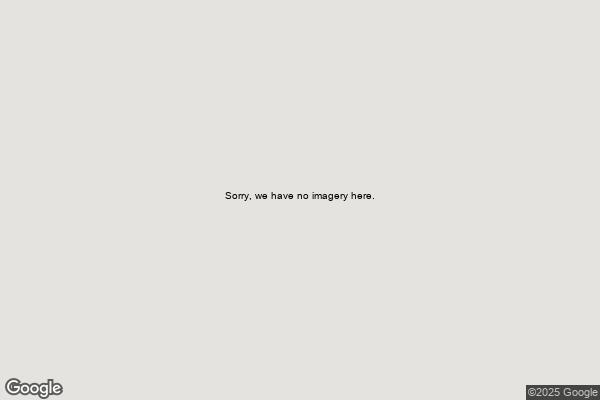


📊 景観分析結果:
   緑視率: 0.0%
   空視率: 0.0%
   歩行者数: 0
   車両数: 0

[2/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　八王子市元八王子町１丁目３５４番２
   緯度経度: (35.664053, 139.285744)
   地価: 105,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.66405306000007,139.28574390000006

📷 ストリートビュー画像取得中...


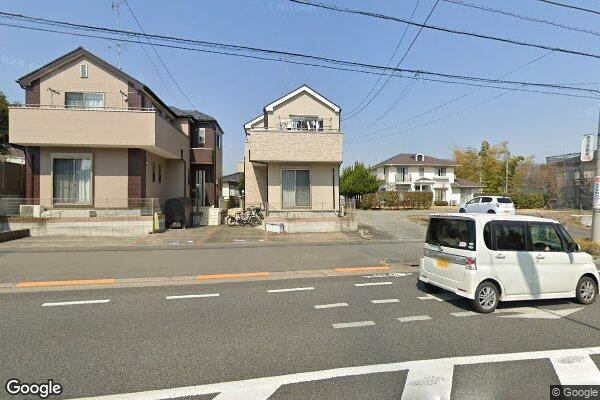


📊 景観分析結果:
   緑視率: 0.7%
   空視率: 30.6%
   歩行者数: 0
   車両数: 1

[3/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　八王子市大塚５８番３７
   緯度経度: (35.639411, 139.414539)
   地価: 153,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.639411110000026,139.41453890000003

📷 ストリートビュー画像取得中...


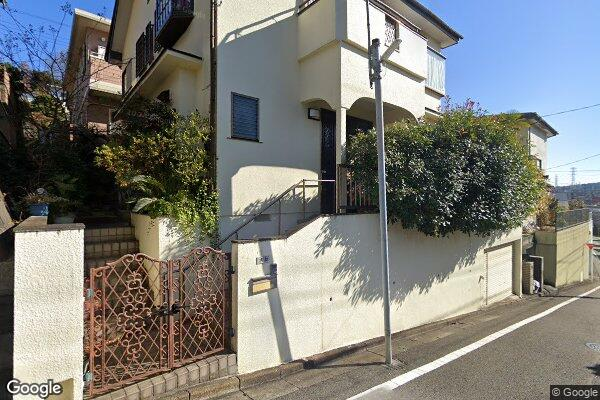


📊 景観分析結果:
   緑視率: 3.0%
   空視率: 17.3%
   歩行者数: 0
   車両数: 0

[4/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　立川市砂川町７丁目５６番６９外
   緯度経度: (35.733255, 139.403838)
   地価: 190,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.733255,139.40383810000003

📷 ストリートビュー画像取得中...


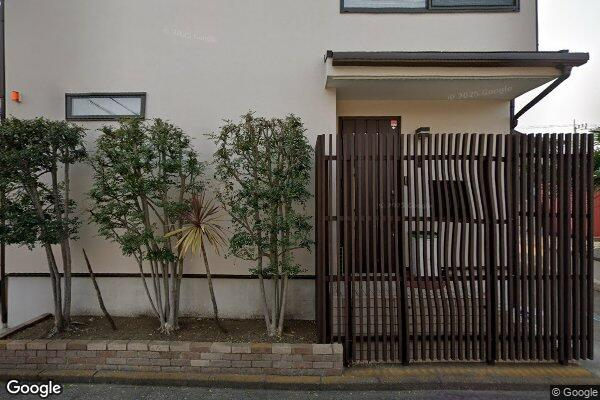


📊 景観分析結果:
   緑視率: 4.1%
   空視率: 1.0%
   歩行者数: 0
   車両数: 0

[5/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　八王子市台町４丁目１４０番７
   緯度経度: (35.656965, 139.318701)
   地価: 240,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.656965,139.3187011000001

📷 ストリートビュー画像取得中...


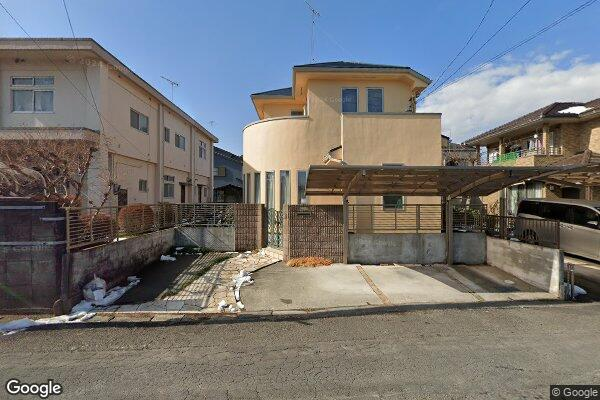


📊 景観分析結果:
   緑視率: 0.4%
   空視率: 22.2%
   歩行者数: 0
   車両数: 0

[6/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　日野市日野本町２丁目６番１４
   緯度経度: (35.676641, 139.397067)
   地価: 291,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.67664111000005,139.39706690000003

📷 ストリートビュー画像取得中...


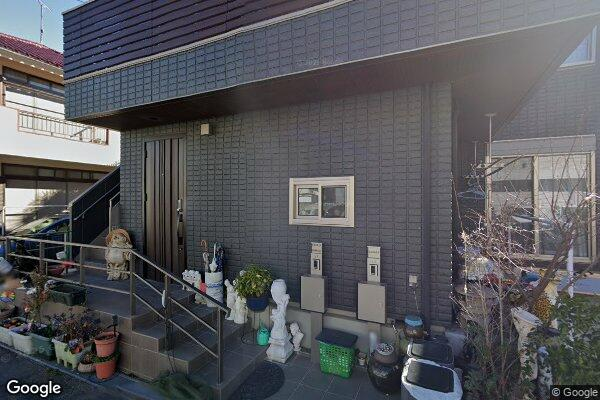


📊 景観分析結果:
   緑視率: 2.4%
   空視率: 25.0%
   歩行者数: 0
   車両数: 0

[7/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　調布市染地２丁目２３番７
   緯度経度: (35.643244, 139.553576)
   地価: 332,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.643243890000065,139.5535761000001

📷 ストリートビュー画像取得中...


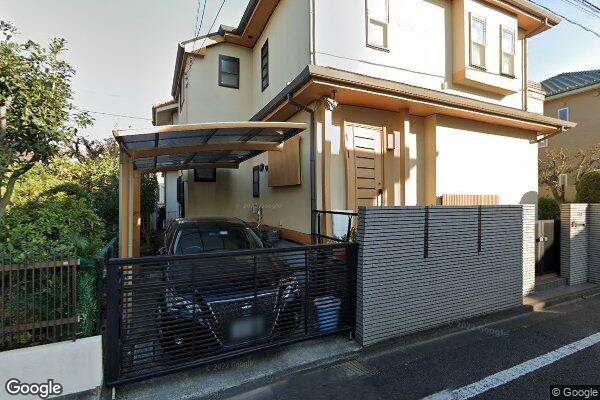


📊 景観分析結果:
   緑視率: 5.3%
   空視率: 14.1%
   歩行者数: 0
   車両数: 0

[8/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　江戸川区篠崎町５丁目８８番５７
   緯度経度: (35.702506, 139.907371)
   地価: 375,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.70250611000006,139.9073711000001

📷 ストリートビュー画像取得中...


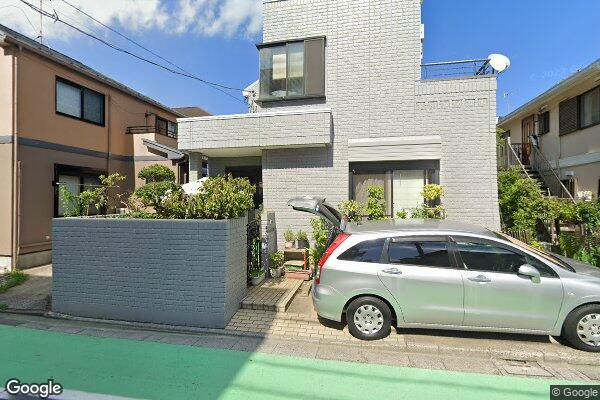


📊 景観分析結果:
   緑視率: 15.1%
   空視率: 23.8%
   歩行者数: 0
   車両数: 1

[9/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　調布市西つつじケ丘１丁目３３番１７
   緯度経度: (35.659908, 139.570642)
   地価: 430,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.65990806000008,139.57064190000006

📷 ストリートビュー画像取得中...


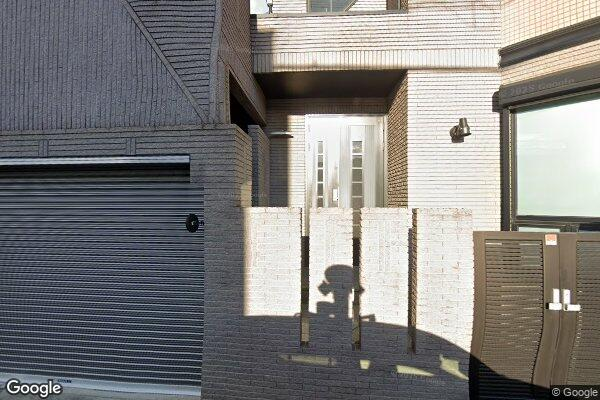


📊 景観分析結果:
   緑視率: 0.2%
   空視率: 27.7%
   歩行者数: 0
   車両数: 0

[10/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　杉並区今川２丁目２１１番
   緯度経度: (35.715002, 139.608853)
   地価: 482,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.715001940000036,139.60885310000003

📷 ストリートビュー画像取得中...


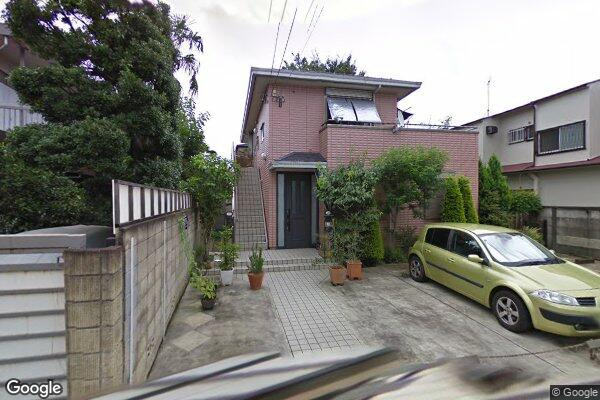


📊 景観分析結果:
   緑視率: 12.4%
   空視率: 5.6%
   歩行者数: 0
   車両数: 1

[11/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　大田区大森西３丁目２１４番５
   緯度経度: (35.573135, 139.729913)
   地価: 548,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.573135,139.7299131000001

📷 ストリートビュー画像取得中...


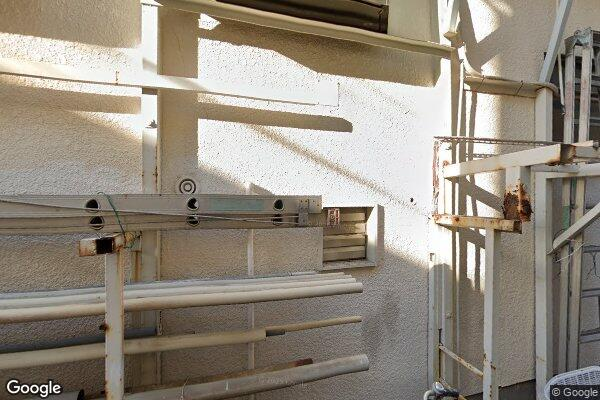


📊 景観分析結果:
   緑視率: 0.1%
   空視率: 0.4%
   歩行者数: 0
   車両数: 0

[12/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　大田区西蒲田８丁目１６番１５
   緯度経度: (35.560436, 139.710778)
   地価: 629,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.56043556000003,139.71077810000008

📷 ストリートビュー画像取得中...


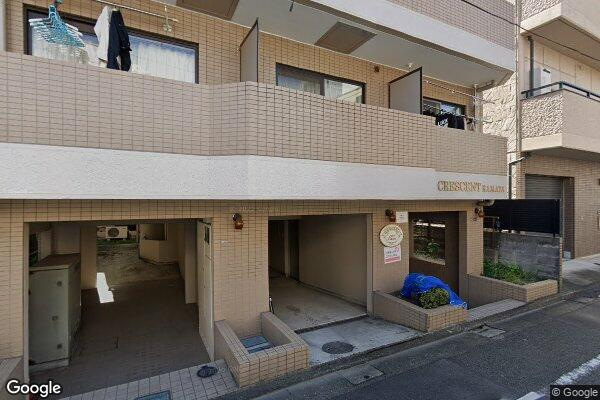


📊 景観分析結果:
   緑視率: 0.5%
   空視率: 10.9%
   歩行者数: 0
   車両数: 0

[13/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　国分寺市南町３丁目２７４５番１７
   緯度経度: (35.698932, 139.477949)
   地価: 721,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.69893194000008,139.47794890000011

📷 ストリートビュー画像取得中...


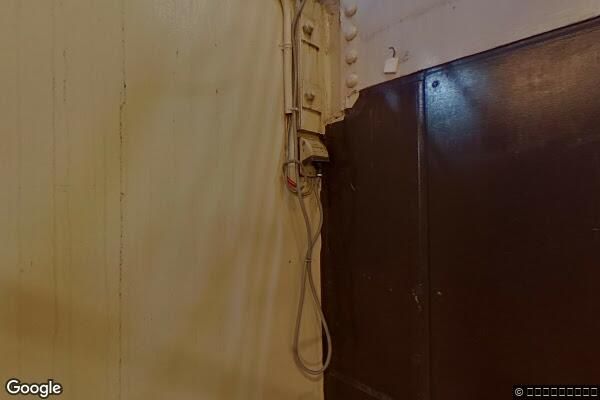


📊 景観分析結果:
   緑視率: 0.0%
   空視率: 1.6%
   歩行者数: 0
   車両数: 0

[14/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　世田谷区上野毛１丁目６２番１０内
   緯度経度: (35.612428, 139.640899)
   地価: 820,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.612427500000024,139.64089890000002

📷 ストリートビュー画像取得中...


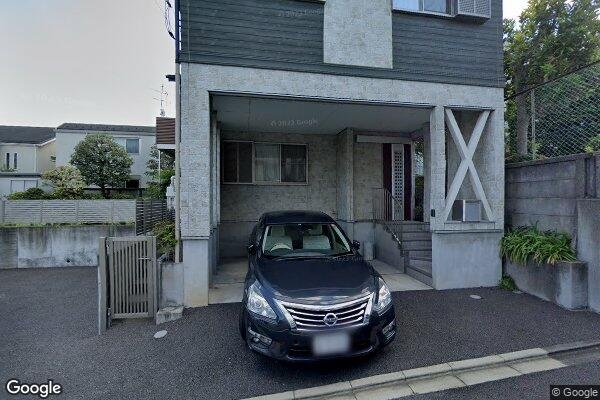


📊 景観分析結果:
   緑視率: 4.8%
   空視率: 56.0%
   歩行者数: 0
   車両数: 1

[15/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　世田谷区下馬６丁目６０番２５
   緯度経度: (35.631894, 139.678121)
   地価: 975,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.63189389000007,139.6781211000001

📷 ストリートビュー画像取得中...


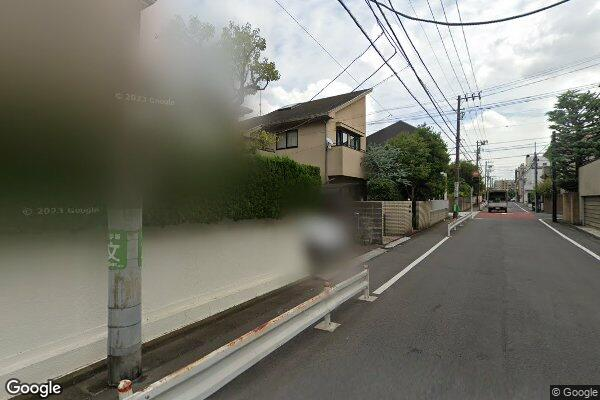


📊 景観分析結果:
   緑視率: 9.6%
   空視率: 2.1%
   歩行者数: 0
   車両数: 0

[16/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　中野区東中野３丁目１２３番８
   緯度経度: (35.709335, 139.681414)
   地価: 1,200,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.709335,139.68141390000005

📷 ストリートビュー画像取得中...


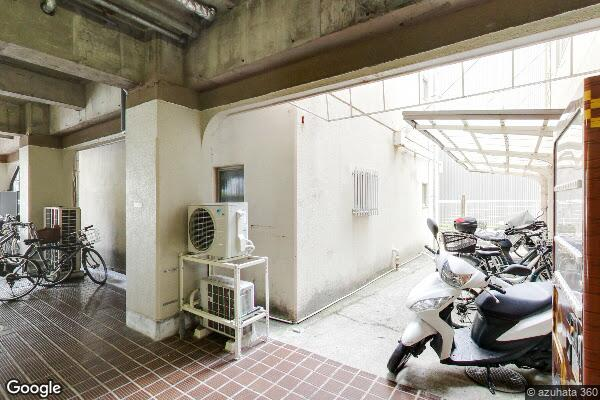


📊 景観分析結果:
   緑視率: 0.3%
   空視率: 0.8%
   歩行者数: 0
   車両数: 0

[17/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　品川区上大崎２丁目５７０番１
   緯度経度: (35.634383, 139.717179)
   地価: 1,630,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.63438306000006,139.71717890000002

📷 ストリートビュー画像取得中...


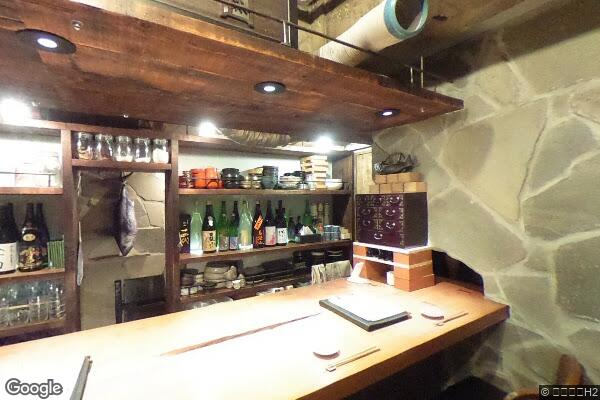


📊 景観分析結果:
   緑視率: 1.3%
   空視率: 0.2%
   歩行者数: 0
   車両数: 0

[18/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　千代田区麹町５丁目７番１外
   緯度経度: (35.683035, 139.734049)
   地価: 2,370,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.683035,139.73404890000006

📷 ストリートビュー画像取得中...


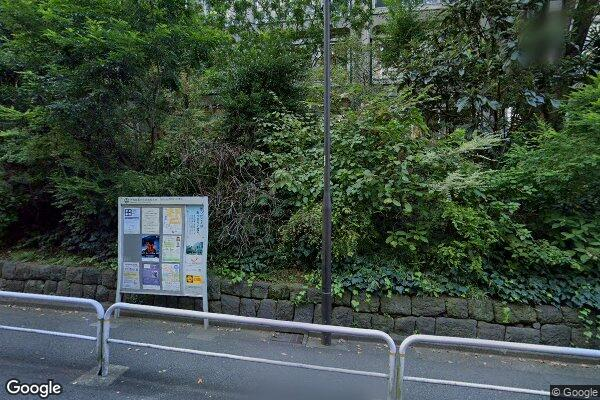


📊 景観分析結果:
   緑視率: 41.5%
   空視率: 22.4%
   歩行者数: 0
   車両数: 0

[19/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　港区麻布台３丁目５番９外
   緯度経度: (35.660594, 139.738880)
   地価: 4,200,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.66059389000003,139.7388800000001

📷 ストリートビュー画像取得中...


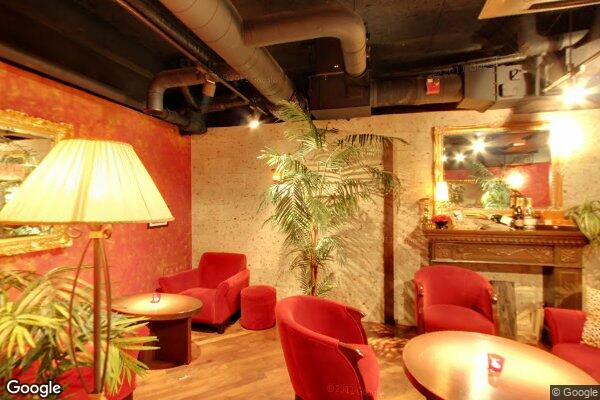


📊 景観分析結果:
   緑視率: 0.0%
   空視率: 0.0%
   歩行者数: 0
   車両数: 0

[20/20] 地価ポイント

📍 地価公示ポイント:
   住所: 東京都　中央区銀座４丁目２番４
   緯度経度: (35.671824, 139.765223)
   地価: 60,500,000 円/m²
   Google Maps: https://www.google.com/maps?q=35.67182389000004,139.76522310000007

📷 ストリートビュー画像取得中...


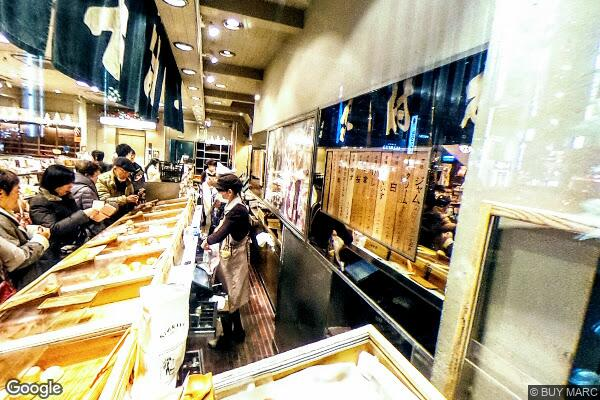


📊 景観分析結果:
   緑視率: 1.0%
   空視率: 4.6%
   歩行者数: 6
   車両数: 0


✅ 処理完了！

結果データ:


,address,lat,lon,price,green_ratio,sky_ratio,pedestrians,cars,maps_url
0,東京都 八王子市美山町９４６番,35.686090,139.248258,1560.0,0.000000,0.000000,0,0,https://www.google.com/maps?q=35.6860897200000...
1,東京都 八王子市元八王子町１丁目３５４番２,35.664053,139.285744,105000.0,0.006971,0.306467,0,1,https://www.google.com/maps?q=35.6640530600000...
2,東京都 八王子市大塚５８番３７,35.639411,139.414539,153000.0,0.030475,0.173217,0,0,https://www.google.com/maps?q=35.6394111100000...
3,東京都 立川市砂川町７丁目５６番６９外,35.733255,139.403838,190000.0,0.041388,0.009908,0,0,"https://www.google.com/maps?q=35.733255,139.40..."
4,東京都 八王子市台町４丁目１４０番７,35.656965,139.318701,240000.0,0.003567,0.221679,0,0,"https://www.google.com/maps?q=35.656965,139.31..."
5,東京都 日野市日野本町２丁目６番１４,35.676641,139.397067,291000.0,0.023500,0.250454,0,0,https://www.google.com/maps?q=35.6766411100000...
6,東京都 調布市染地２丁目２３番７,35.643244,139.553576,332000.0,0.053242,0.140937,0,0,https://www.google.com/maps?q=35.6432438900000...
7,東京都 江戸川区篠崎町５丁目８８番５７,35.702506,139.907371,375000.0,0.150512,0.237571,0,1,https://www.google.com/maps?q=35.7025061100000...
8,東京都 調布市西つつじケ丘１丁目３３番１７,35.659908,139.570642,430000.0,0.001821,0.277092,0,0,https://www.google.com/maps?q=35.6599080600000...
9,東京都 杉並区今川２丁目２１１番,35.715002,139.608853,482000.0,0.124133,0.055600,0,1,https://www.google.com/maps?q=35.7150019400000...



CSVファイル保存: streetview_analysis_dataset.csv


In [7]:
import time
from IPython.display import display

records = []

print("Starting batch processing...\n")
print(f"解析対象: {len(selected_land)} 件の地価ポイント\n")

for i, row in selected_land.iterrows():
    lat = row['lat']
    lon = row['lon']
    price = row['price']
    address = row['address']
    
    print(f"\n{'='*70}")
    print(f"[{i+1}/{len(selected_land)}] 地価ポイント")
    print(f"{'='*70}")
    
    # 地価ポイント情報を表示
    maps_url = f"https://www.google.com/maps?q={lat},{lon}"
    print(f"\n📍 地価公示ポイント:")
    print(f"   住所: {address}")
    print(f"   緯度経度: ({lat:.6f}, {lon:.6f})")
    print(f"   地価: {price:,.0f} 円/m²")
    print(f"   Google Maps: {maps_url}")

    # この位置のストリートビュー画像を取得
    print(f"\n📷 ストリートビュー画像取得中...")
    if API_KEY == "YOUR_API_KEY_HERE":
        print("⚠️ Warning: API Key not set. Skipping image fetch.")
        img = None
    else:
        img = fetch_streetview(lat, lon)
    
    if img:
        display(img)
        
        green = calc_green_ratio(img)
        sky = calc_sky_ratio(img)
        ped, car = detect_objects(img)
        
        print(f"\n📊 景観分析結果:")
        print(f"   緑視率: {green:.1%}")
        print(f"   空視率: {sky:.1%}")
        print(f"   歩行者数: {ped}")
        print(f"   車両数: {car}")
    else:
        green, sky, ped, car = 0, 0, 0, 0
        print("⚠️ 画像取得失敗")

    records.append({
        "address": address,
        "lat": lat,
        "lon": lon,
        "price": price,
        "green_ratio": green,
        "sky_ratio": sky,
        "pedestrians": ped,
        "cars": car,
        "maps_url": maps_url
    })

    time.sleep(0.5)

df_result = pd.DataFrame(records)
df_result.to_csv("streetview_analysis_dataset.csv", index=False)

print(f"\n\n{'='*70}")
print("✅ 処理完了！")
print(f"{'='*70}")
print("\n結果データ:")
display(df_result)
print(f"\nCSVファイル保存: streetview_analysis_dataset.csv")

# 🚀 STEP 9: 相関分析

/var/folders/fx/w4bms7s97x546scw80w_18100000gq/T/ipykernel_37498/3591706275.py:30: UserWarning: Glyph 32209 (\N{CJK UNIFIED IDEOGRAPH-7DD1}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/fx/w4bms7s97x546scw80w_18100000gq/T/ipykernel_37498/3591706275.py:30: UserWarning: Glyph 35222 (\N{CJK UNIFIED IDEOGRAPH-8996}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/fx/w4bms7s97x546scw80w_18100000gq/T/ipykernel_37498/3591706275.py:30: UserWarning: Glyph 29575 (\N{CJK UNIFIED IDEOGRAPH-7387}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/fx/w4bms7s97x546scw80w_18100000gq/T/ipykernel_37498/3591706275.py:30: UserWarning: Glyph 22320 (\N{CJK UNIFIED IDEOGRAPH-5730}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/fx/w4bms7s97x546scw80w_18100000gq/T/ipykernel_37498/3591706275.py:30: UserWarning: Glyph 20385 (\N{CJK UNIFIED IDEOGRAPH-4FA1}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/fx/w4bm

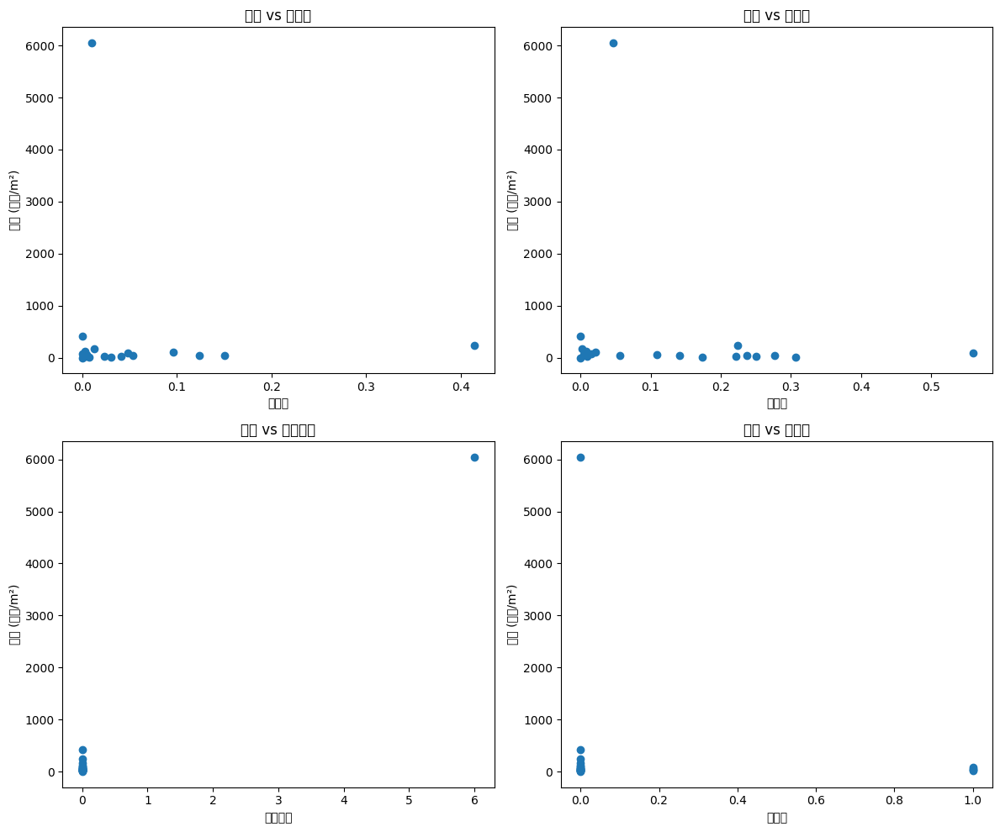


相関係数:
price          1.000000
green_ratio   -0.081758
sky_ratio     -0.153547
pedestrians    0.997334
cars          -0.128988
Name: price, dtype: float64


In [8]:
import matplotlib.pyplot as plt

# 地価と景観指標の相関を可視化
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# 地価 vs 緑視率
axes[0, 0].scatter(df_result['green_ratio'], df_result['price']/10000)
axes[0, 0].set_xlabel('緑視率')
axes[0, 0].set_ylabel('地価 (万円/m²)')
axes[0, 0].set_title('地価 vs 緑視率')

# 地価 vs 空視率
axes[0, 1].scatter(df_result['sky_ratio'], df_result['price']/10000)
axes[0, 1].set_xlabel('空視率')
axes[0, 1].set_ylabel('地価 (万円/m²)')
axes[0, 1].set_title('地価 vs 空視率')

# 地価 vs 歩行者数
axes[1, 0].scatter(df_result['pedestrians'], df_result['price']/10000)
axes[1, 0].set_xlabel('歩行者数')
axes[1, 0].set_ylabel('地価 (万円/m²)')
axes[1, 0].set_title('地価 vs 歩行者数')

# 地価 vs 車両数
axes[1, 1].scatter(df_result['cars'], df_result['price']/10000)
axes[1, 1].set_xlabel('車両数')
axes[1, 1].set_ylabel('地価 (万円/m²)')
axes[1, 1].set_title('地価 vs 車両数')

plt.tight_layout()
plt.savefig('price_correlation.png', dpi=150)
plt.show()

print("\n相関係数:")
print(df_result[['price', 'green_ratio', 'sky_ratio', 'pedestrians', 'cars']].corr()['price'])